In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd
import anndata
import scvelo as scv
import scanpy as sc

from scipy.sparse import csr_matrix
from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.neighbors import kneighbors_graph
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.axes._axes import _log as matplotlib_axes_logger
from RnaVeloDataset import RnaVeloDataset
# from symsimDataset import SymsimBifur, SymsimTree, SymsimBranch, SymsimLinear, SymsimCycle

from symsimDataset_me import SymsimBifur, SymsimBifurNoisy, SymsimTree, SymsimTreeNoisy

from realDataset import realDataset
from unsupervised_loss import UnsupervisedLoss

import torch
import torch.nn.functional as F
import torch.nn as nn
from sklearn.metrics import roc_auc_score
from torch_geometric.data import DataLoader
from model.BaseModel import BaseModel
from sklearn.metrics import mean_squared_error
from model.autoencoder import AutoEncoder

from model.mymodel import MyModel, GraphSAGEModel, FCModel, veloModel, DiffusionModel


from math import sqrt
import scprep
import utils
import backbone

from torch_geometric.data import Data

In [2]:
dataBifur = SymsimBifur()
dataTree = SymsimTree()
# datalinear = SymsimLinear()
dataDyngen = RnaVeloDataset()
dataReal = realDataset()
dataTreeNoisy = SymsimTreeNoisy()


In [3]:
t = np.arange(1,10)
# dataset for training
train_mask = list(t) + list(t+10) + list(t+20) + list(t+30) + list(t+40) + list(t+50) + list(t+60) + list(t+70) + list(t+80) + list(t+90)

# dataset for validation
val_mask = [10*i for i in range(10)]

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
Path = "./Diffusion_symsim_tree_bifur_trifur_without_noise.pt"

model = DiffusionModel(dataBifur.num_features, hidden1 = 128, hidden2 = 64, max_diffusion = 6, include_reversed = True, device = device, dropout1=0.4, dropout2=0.2).to(device)

model.load_state_dict(torch.load(Path, map_location=torch.device('cpu')))
model.eval()

DiffusionModel(
  (conv1): GraphDiffusion (300 -> 128)
  (conv2): GraphDiffusion (128 -> 64)
  (lin): Linear(in_features=64, out_features=1, bias=True)
)

# Noiseless dataset

pearson corr: 0.5174271354627774 , kendall tau: 0.4693582852155092
pearson corr: 0.5978009012284149 , kendall tau: 0.6078061485116965
pearson corr: 0.6107984586890958 , kendall tau: 0.6151219967814682
pearson corr: 0.6722985746202348 , kendall tau: 0.5720426697137609
pearson corr: 0.5818945767593099 , kendall tau: 0.6061701293800611
pearson corr: 0.6211357194049305 , kendall tau: 0.641511166661503
pearson corr: 0.720030720881679 , kendall tau: 0.6266876452942407
pearson corr: 0.6803476523412237 , kendall tau: 0.6156189745688939
pearson corr: 0.6631566267018878 , kendall tau: 0.6154745062187628
pearson corr: 0.6948479657881161 , kendall tau: 0.6095931288109881


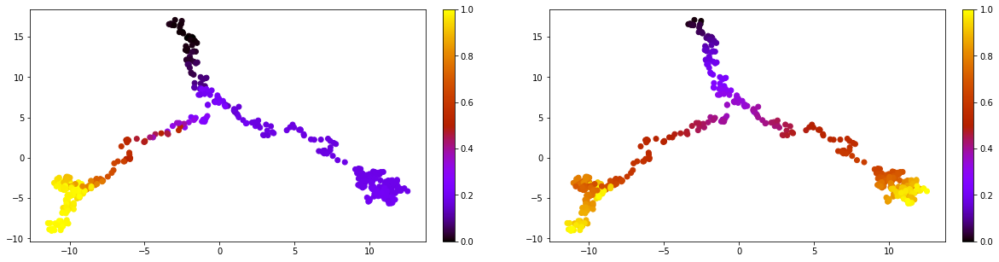

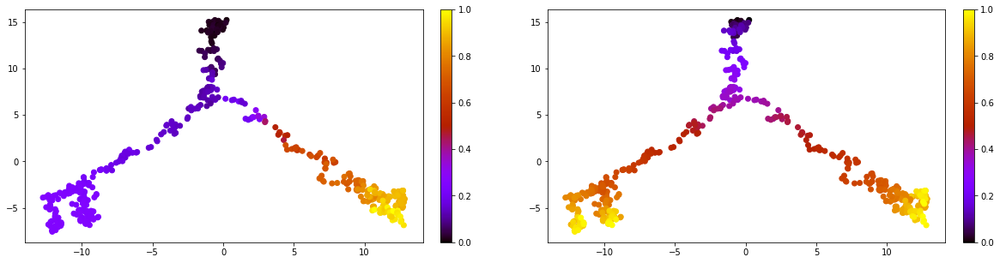

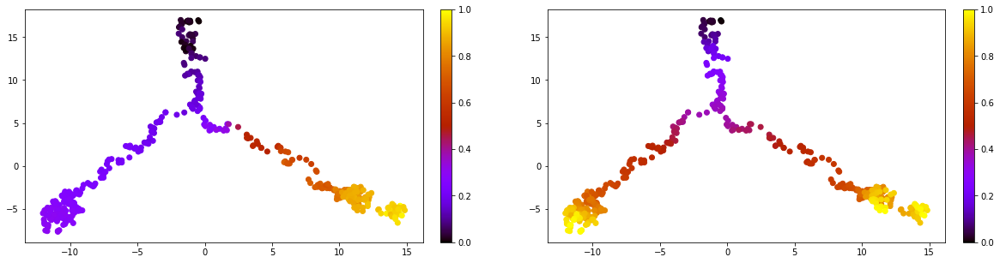

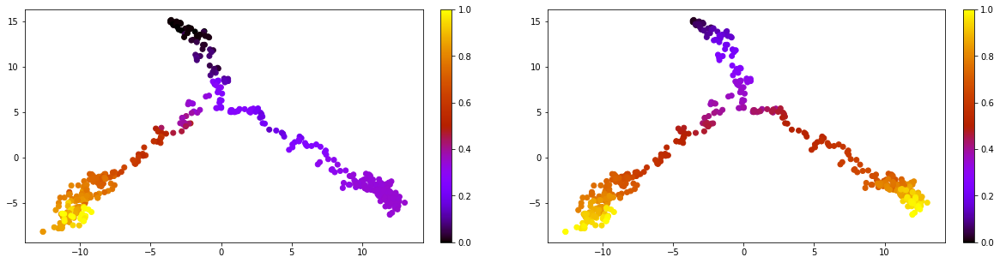

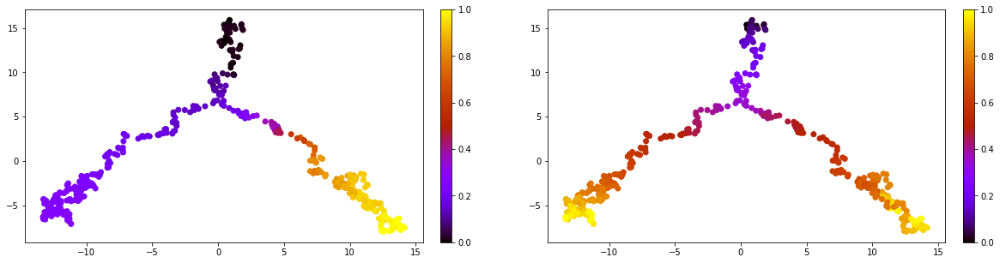

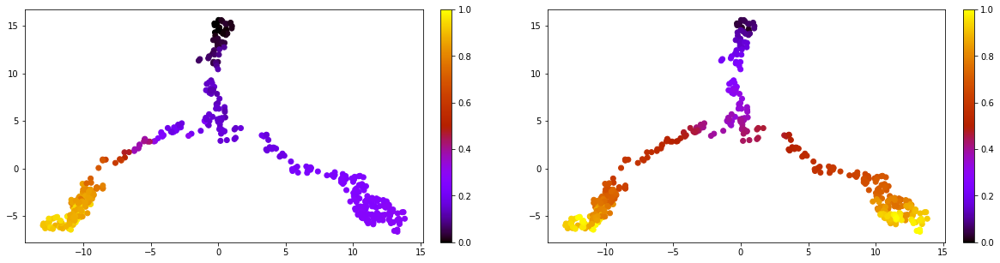

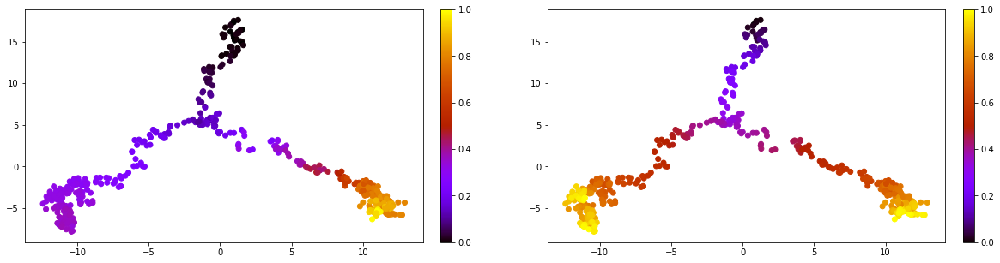

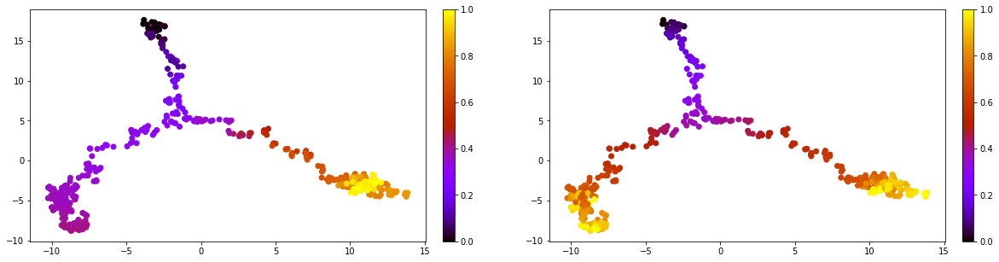

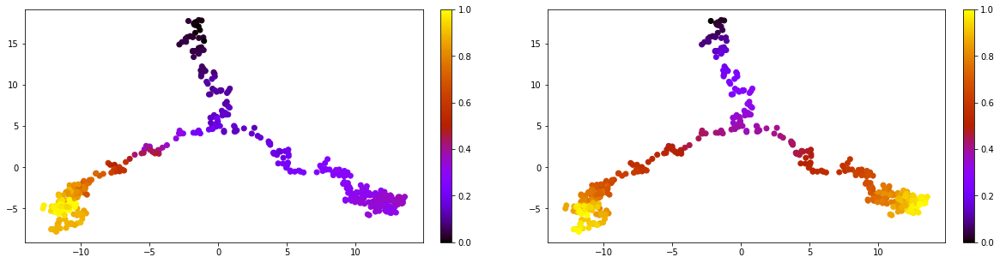

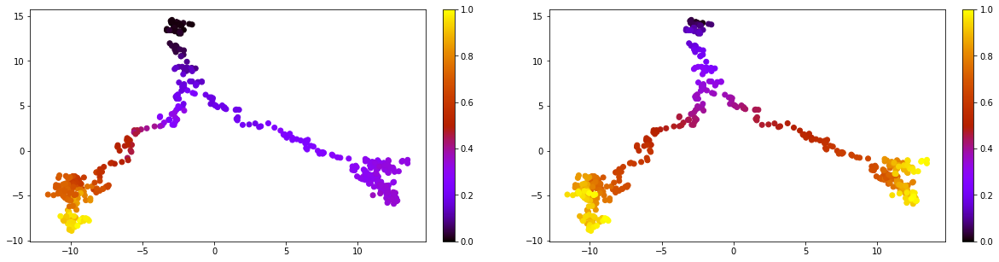

In [5]:
for idx, data in enumerate(DataLoader(dataTree[val_mask])):
    pt = data.y_vdpt[0]
    X_pca = utils.pca_op(data.x.detach().numpy())
    fig = plt.figure(figsize = (20, 5))
    ax1, ax2 = fig.subplots(1,2)
    pseudo_visual = ax1.scatter(X_pca[:,0], X_pca[:,1], c = pt, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax1)

    pt_true = data.y.cpu().numpy().squeeze()
    pseudo_visual = ax2.scatter(X_pca[:,0], X_pca[:,1], c = pt_true, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax2)

    vx = pt - np.mean(pt)
    vy = pt_true - np.mean(pt_true)
    pearson = np.sum(vx * vy) / (np.sqrt(np.sum(vx ** 2)) * np.sqrt(np.sum(vy ** 2)))
    kt = utils.kendalltau(pt, pt_true)
    print('pearson corr:',pearson,', kendall tau:',kt)

pearson corr: 0.93370193 , kendall tau: 0.687792663077501
pearson corr: 0.94276285 , kendall tau: 0.7654021117649513
pearson corr: 0.96863765 , kendall tau: 0.8377530153165561
pearson corr: 0.9519376 , kendall tau: 0.8018279704519845
pearson corr: 0.9703778 , kendall tau: 0.8334627102374692
pearson corr: 0.9587667 , kendall tau: 0.8245649179917366
pearson corr: 0.9046669 , kendall tau: 0.7307958766328618
pearson corr: 0.96590054 , kendall tau: 0.8097742164350404
pearson corr: 0.971012 , kendall tau: 0.8652476941696924
pearson corr: 0.95377344 , kendall tau: 0.7453194774842452


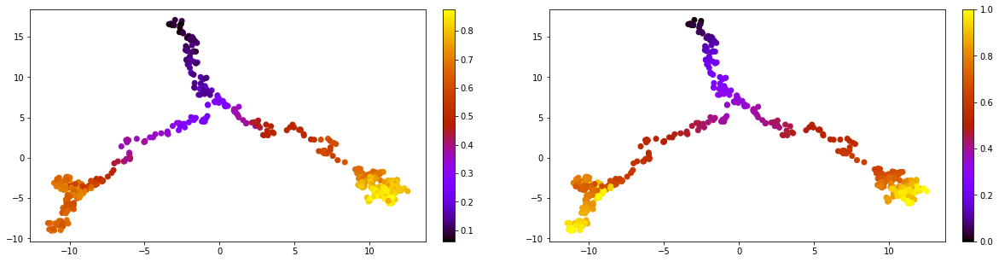

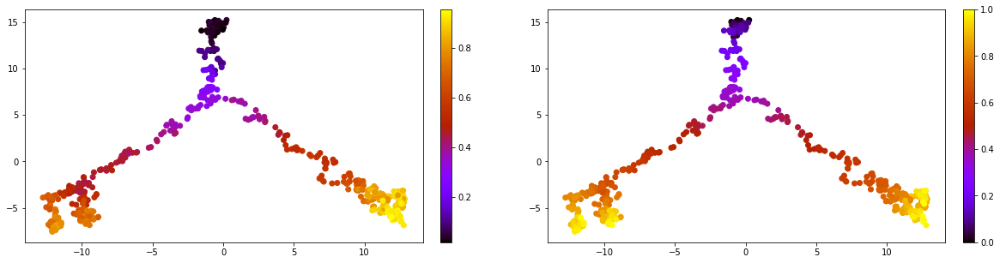

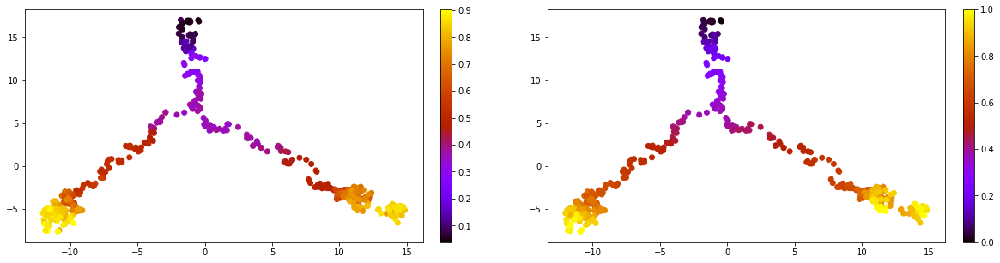

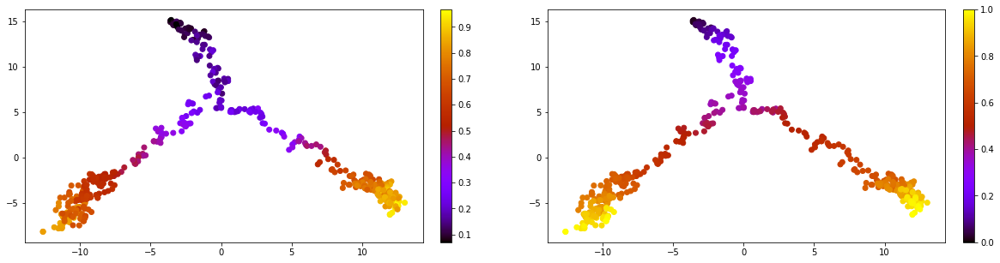

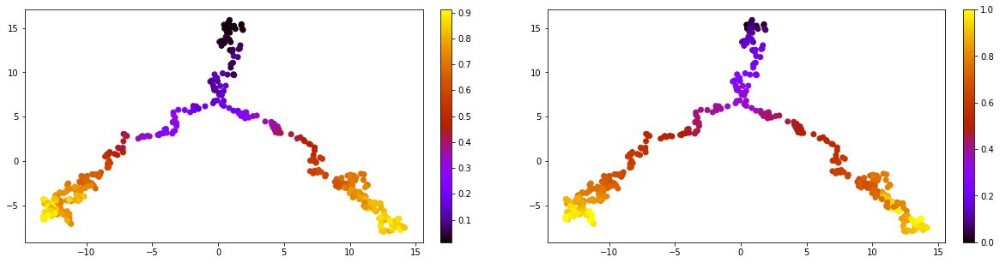

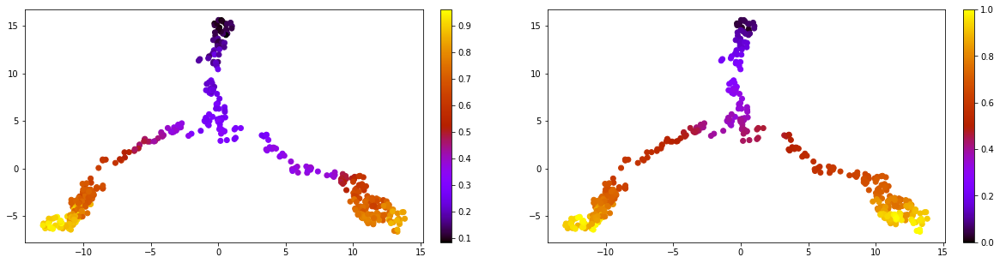

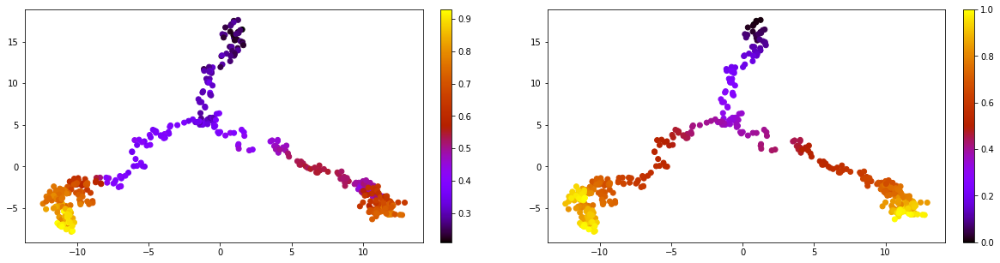

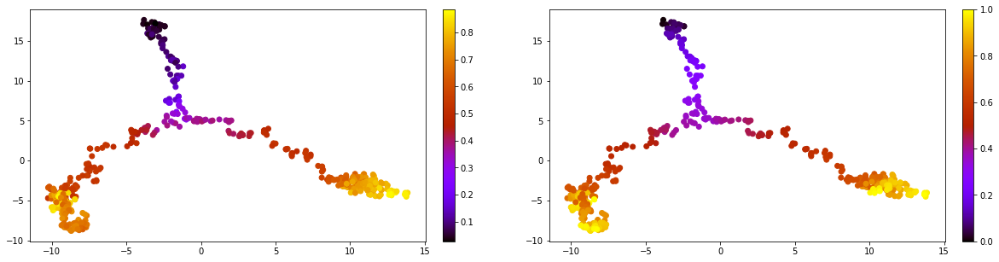

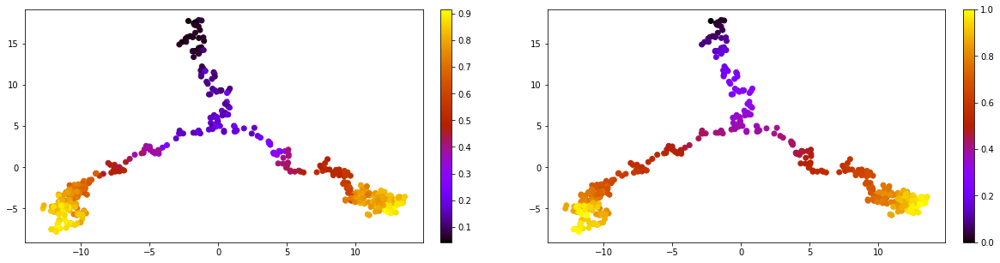

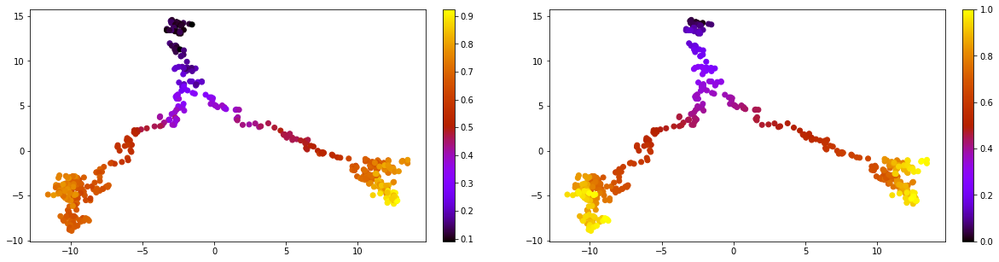

In [6]:
for idx, data in enumerate(DataLoader(dataTree[val_mask])):
    X_pca = utils.pca_op(data.x.detach().numpy(), standardize=False)

    pt, _, _ = model(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    pt = pt.detach().cpu().numpy().reshape(-1)
    fig = plt.figure(figsize = (20, 5))
    ax1, ax2 = fig.subplots(1,2)
    pseudo_visual = ax1.scatter(X_pca[:,0], X_pca[:,1], c = pt, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax1)

    pt_true = data.y.cpu().numpy().squeeze()
    pseudo_visual = ax2.scatter(X_pca[:,0], X_pca[:,1], c = pt_true, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax2)

    vx = pt - np.mean(pt)
    vy = pt_true - np.mean(pt_true)
    pearson = np.sum(vx * vy) / (np.sqrt(np.sum(vx ** 2)) * np.sqrt(np.sum(vy ** 2)))
    kt = utils.kendalltau(pt, pt_true)
    print('pearson corr:',pearson,', kendall tau:',kt)

# Noisy dataset

pearson corr: -0.05474083999941431 , kendall tau: 0.018638621092608824
pearson corr: 0.008779502635782385 , kendall tau: -0.011543758607737573
pearson corr: -0.07238964843001418 , kendall tau: 0.001343850423605025
pearson corr: -0.08985786013552625 , kendall tau: -0.25475564458912403
pearson corr: -0.11783333871696057 , kendall tau: -0.25983998931819013
pearson corr: 0.569953492593582 , kendall tau: 0.607679145277743
pearson corr: 0.12314272191454682 , kendall tau: -0.009674053670547973
pearson corr: -0.032671776732814725 , kendall tau: -0.007837736321522475
pearson corr: -0.03808294184498112 , kendall tau: 0.010041317140353074
pearson corr: 0.07552392907137828 , kendall tau: 0.001994908392804975


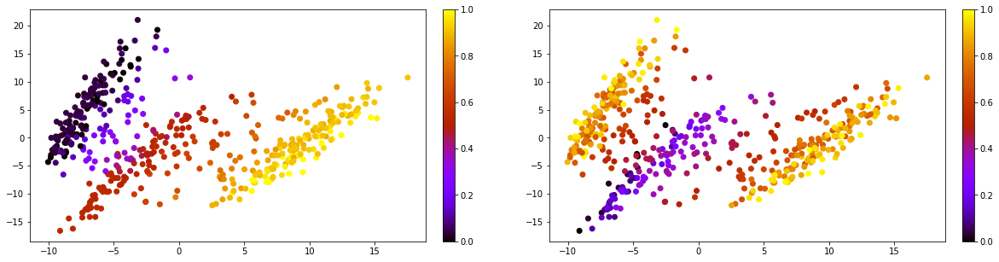

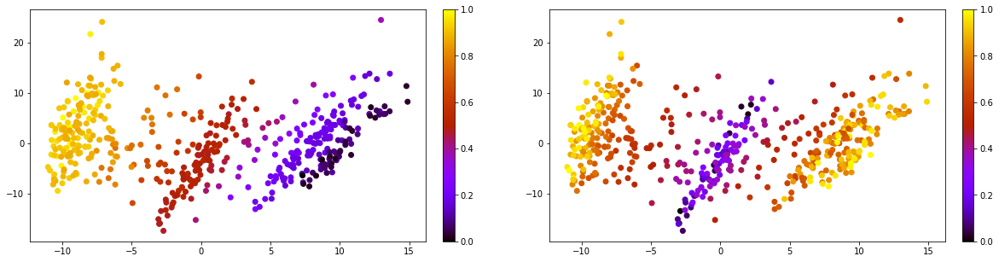

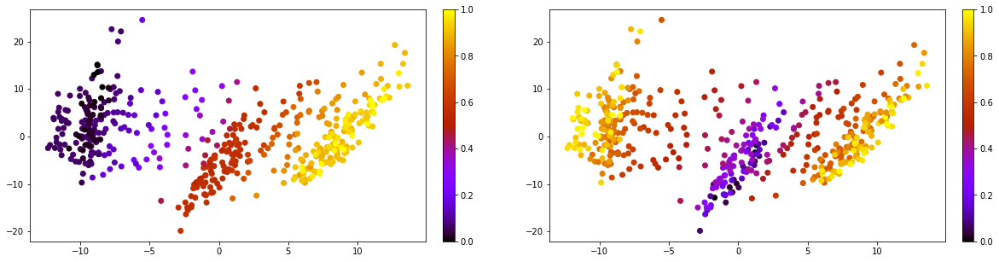

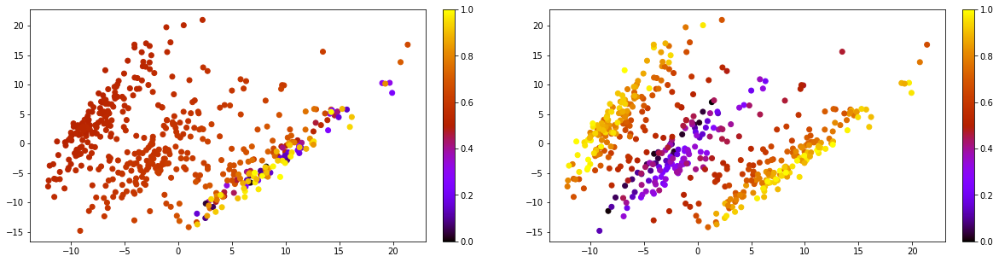

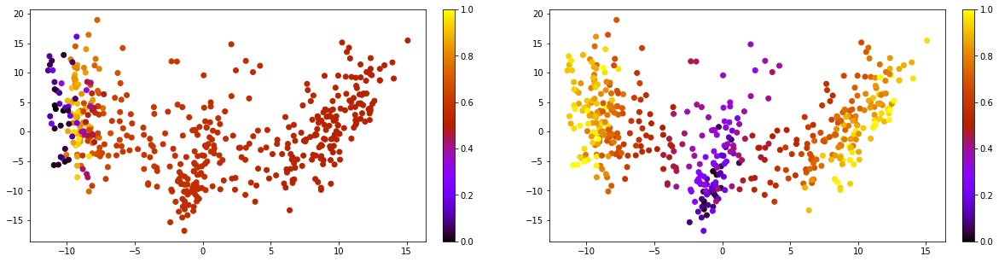

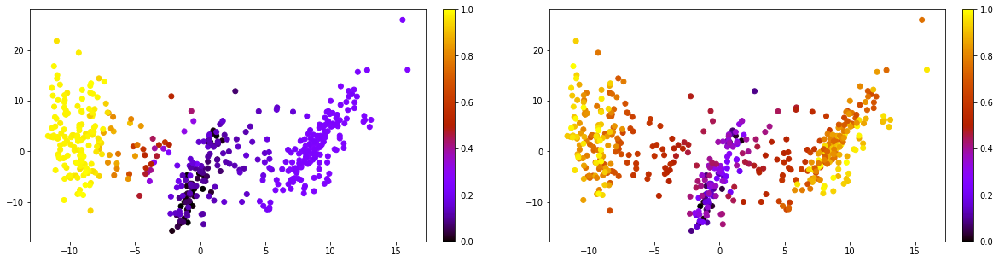

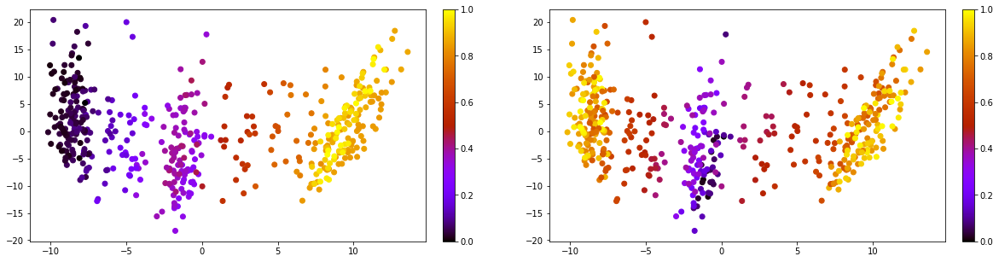

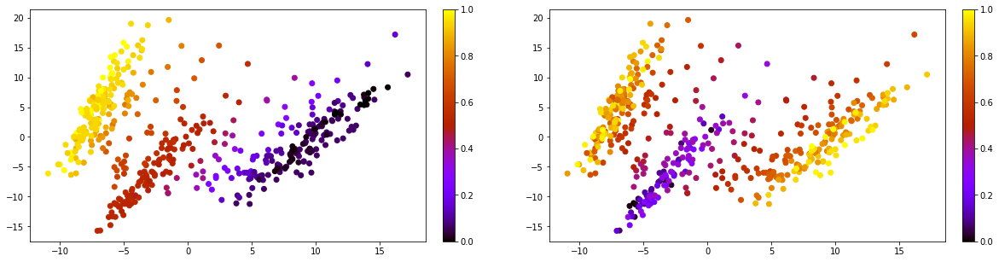

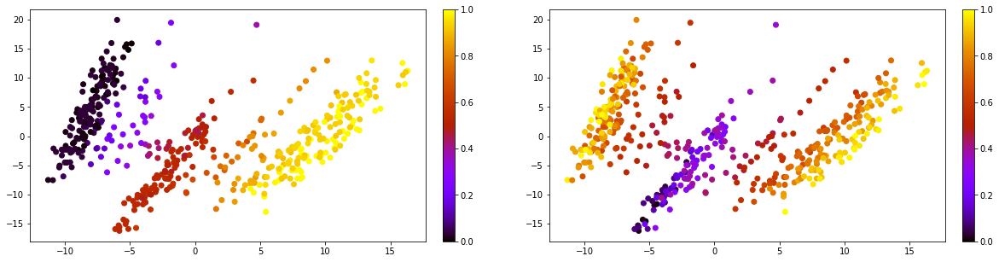

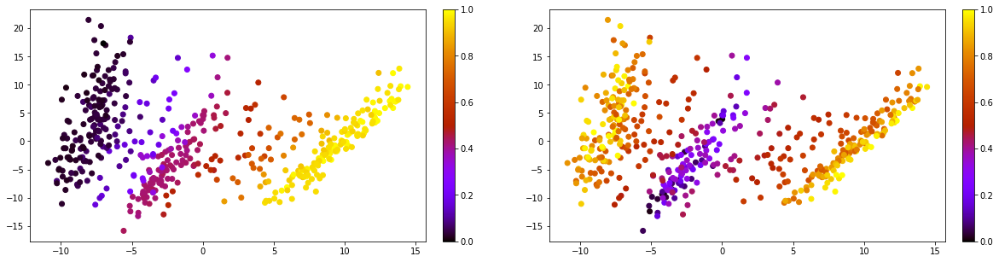

In [7]:
for idx, data in enumerate(DataLoader(dataTreeNoisy[val_mask])):
    pt = data.y_vdpt[0]
    X_pca = utils.pca_op(data.x.detach().numpy())
    fig = plt.figure(figsize = (20, 5))
    ax1, ax2 = fig.subplots(1,2)
    pseudo_visual = ax1.scatter(X_pca[:,0], X_pca[:,1], c = pt, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax1)

    pt_true = data.y.cpu().numpy().squeeze()
    pseudo_visual = ax2.scatter(X_pca[:,0], X_pca[:,1], c = pt_true, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax2)

    vx = pt - np.mean(pt)
    vy = pt_true - np.mean(pt_true)
    pearson = np.sum(vx * vy) / (np.sqrt(np.sum(vx ** 2)) * np.sqrt(np.sum(vy ** 2)))
    kt = utils.kendalltau(pt, pt_true)
    print('pearson corr:',pearson,', kendall tau:',kt)

pearson corr: 0.78962725 , kendall tau: 0.5144109177413297
pearson corr: 0.7743452 , kendall tau: 0.545895413380076
pearson corr: 0.629693 , kendall tau: 0.41696924168440386
pearson corr: 0.6069325 , kendall tau: 0.4156170443637578
pearson corr: 0.8311565 , kendall tau: 0.5638746296064439
pearson corr: 0.80051786 , kendall tau: 0.5334752305830308
pearson corr: 0.6943025 , kendall tau: 0.4918909895246442
pearson corr: 0.7156948 , kendall tau: 0.4049664037394099
pearson corr: 0.7947782 , kendall tau: 0.5245607445432161
pearson corr: 0.7348524 , kendall tau: 0.5013730645632487


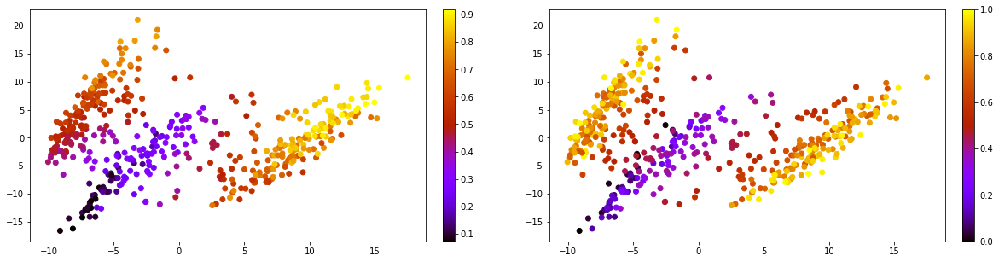

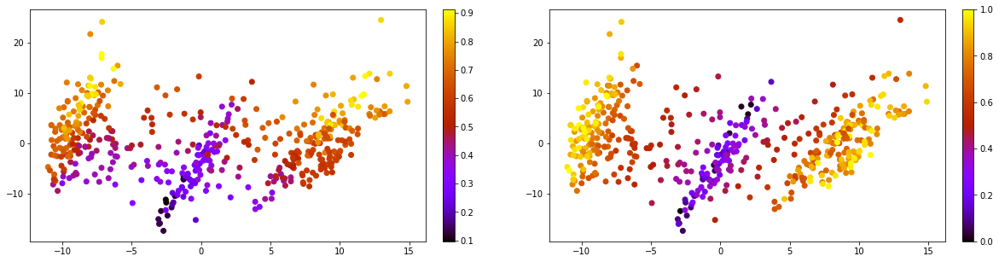

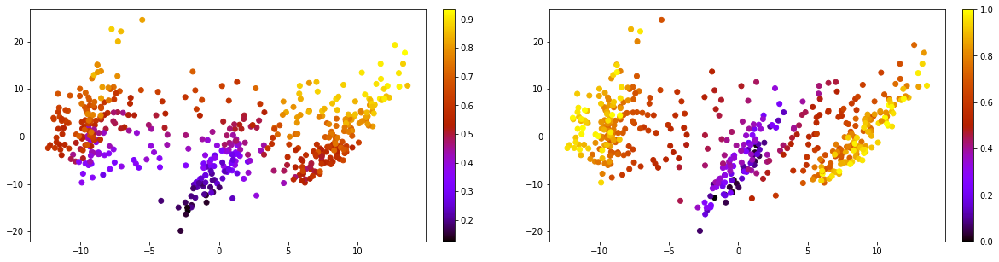

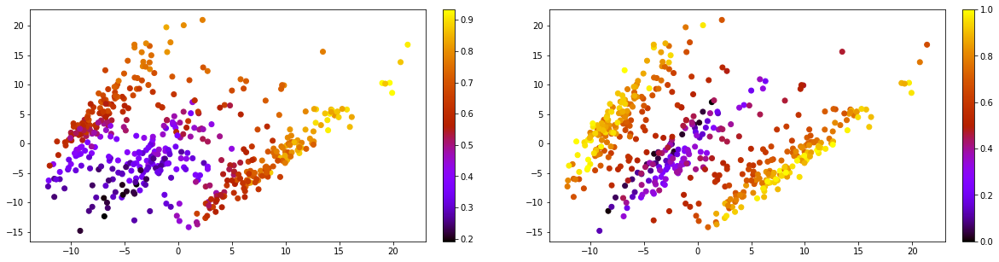

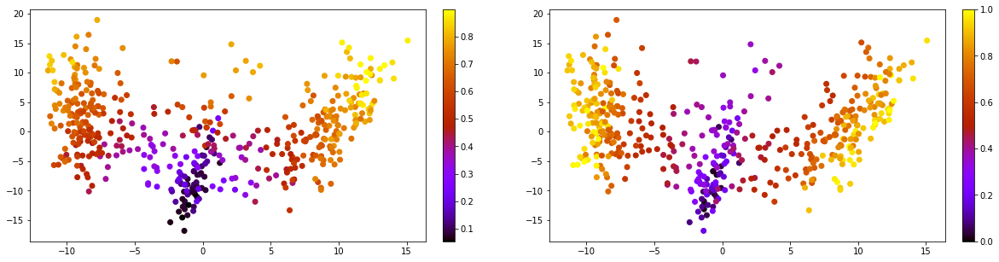

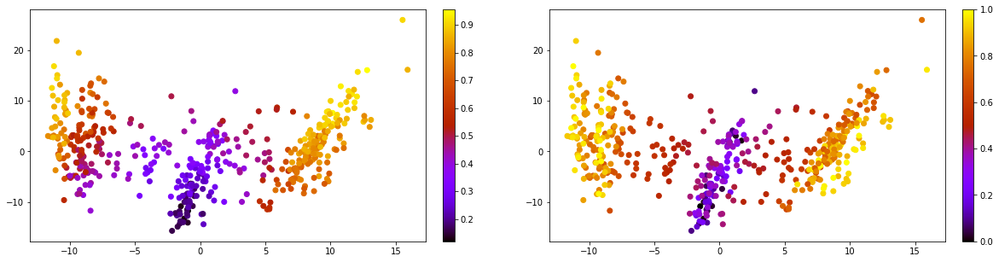

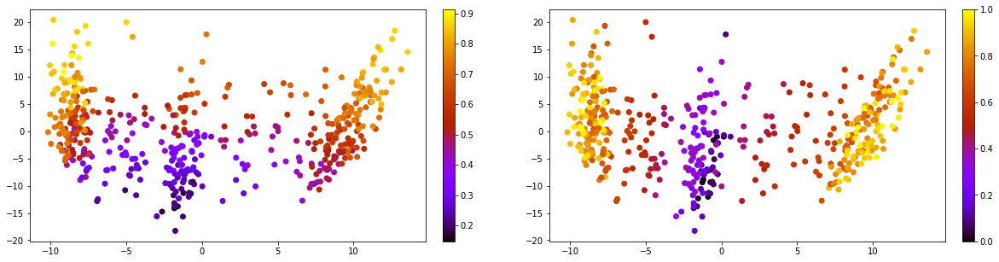

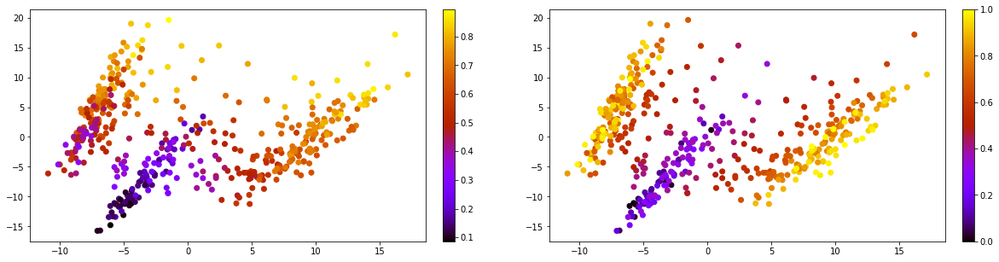

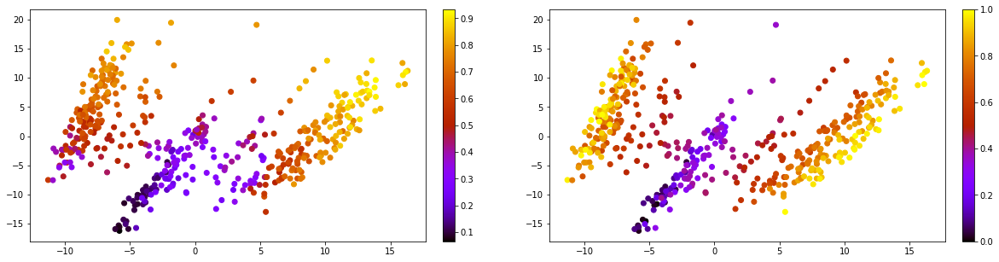

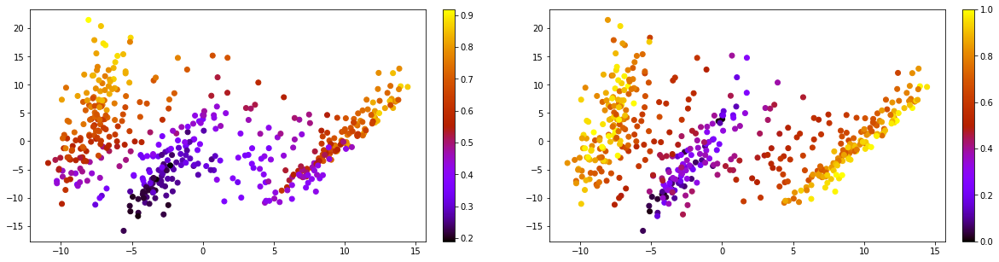

In [8]:
for idx, data in enumerate(DataLoader(dataTreeNoisy[val_mask])):
    X_pca = utils.pca_op(data.x.detach().numpy(), standardize=False)

    pt, _, _ = model(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    pt = pt.detach().cpu().numpy().reshape(-1)
    fig = plt.figure(figsize = (20, 5))
    ax1, ax2 = fig.subplots(1,2)
    pseudo_visual = ax1.scatter(X_pca[:,0], X_pca[:,1], c = pt, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax1)

    pt_true = data.y.cpu().numpy().squeeze()
    pseudo_visual = ax2.scatter(X_pca[:,0], X_pca[:,1], c = pt_true, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax2)

    vx = pt - np.mean(pt)
    vy = pt_true - np.mean(pt_true)
    pearson = np.sum(vx * vy) / (np.sqrt(np.sum(vx ** 2)) * np.sqrt(np.sum(vy ** 2)))
    kt = utils.kendalltau(pt, pt_true)
    print('pearson corr:',pearson,', kendall tau:',kt)

# Dyngen dataset

pearson corr: -0.91088927 , kendall tau: -0.8347995038190656
pearson corr: -0.93589914 , kendall tau: -0.8501497980350733
pearson corr: -0.8555826 , kendall tau: -0.7074472352166705
pearson corr: -0.940016 , kendall tau: -0.8780759969554869
pearson corr: -0.91568506 , kendall tau: -0.8232256638147126
pearson corr: -0.9080719 , kendall tau: -0.8422043293316759
pearson corr: -0.8823342 , kendall tau: -0.7287073579319957
pearson corr: -0.9317798 , kendall tau: -0.8299389676286191
pearson corr: -0.9215608 , kendall tau: -0.8521456344437602
pearson corr: -0.90195733 , kendall tau: -0.8273437946311216
pearson corr: -0.91290665 , kendall tau: -0.819493300699267


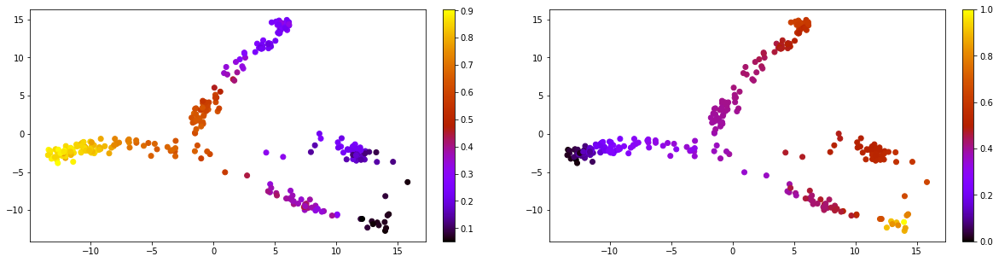

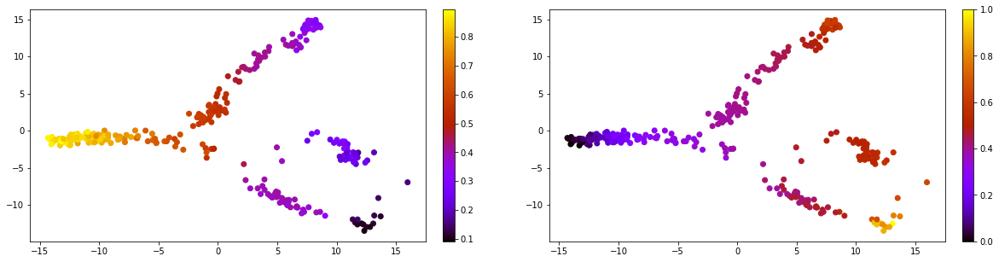

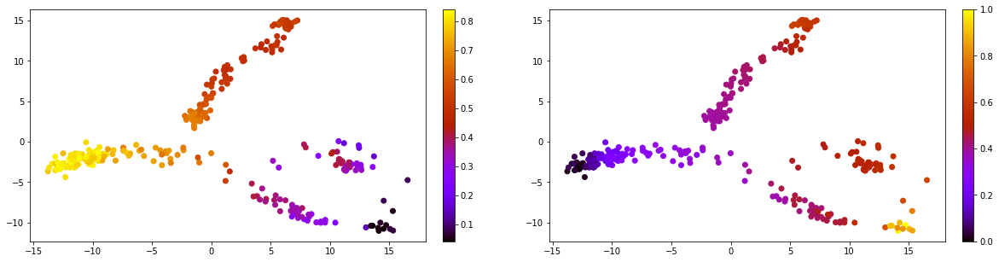

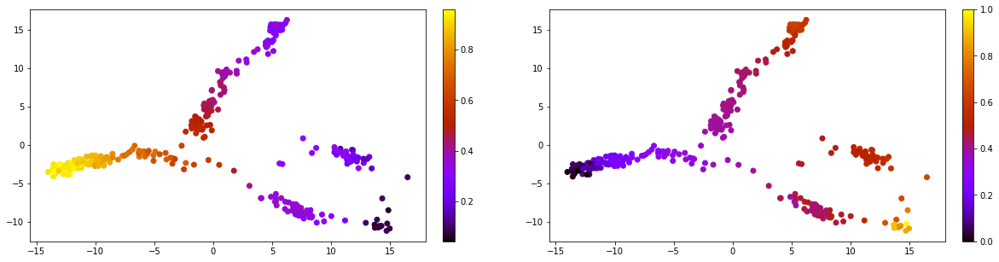

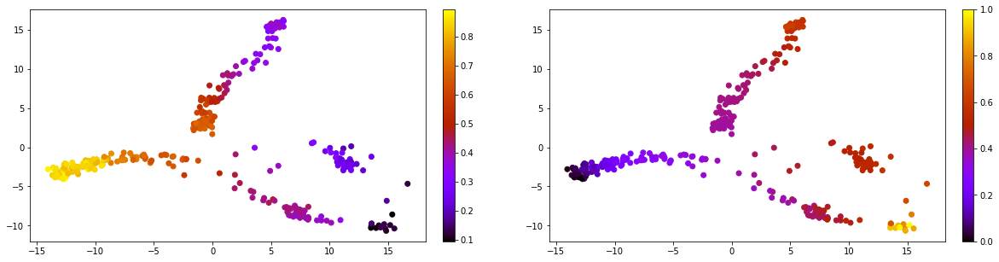

...

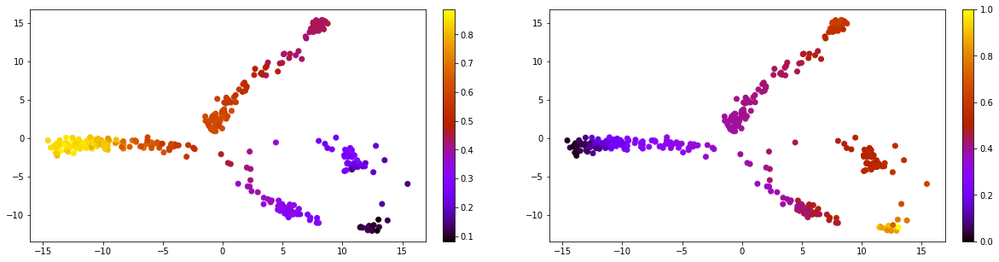

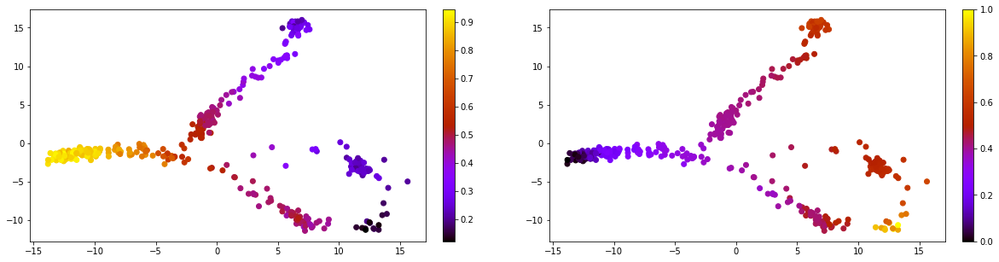

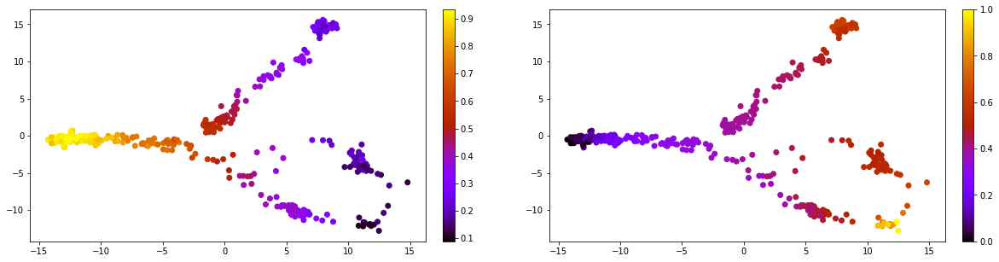

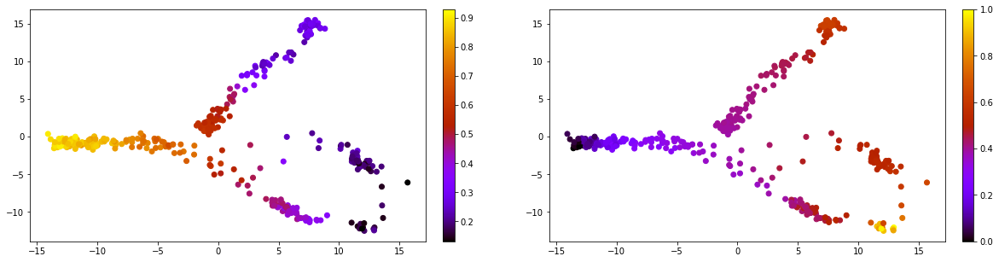

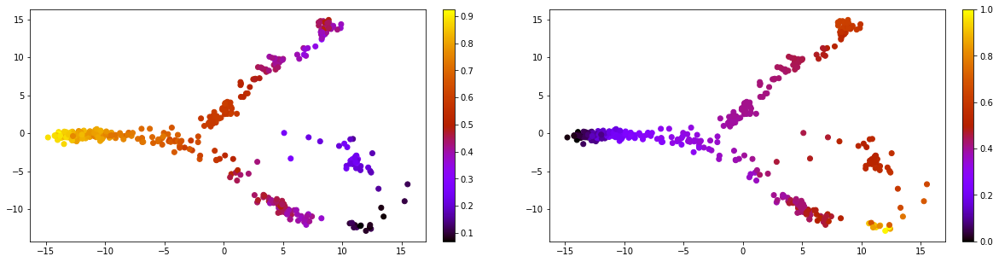

In [10]:
for idx, data in enumerate(DataLoader(dataDyngen)):
    X_pca = utils.pca_op(data.x.detach().numpy(), standardize=False)
    
    pt, _, _ = model(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    pt = pt.detach().cpu().numpy().reshape(-1)
    fig = plt.figure(figsize = (20, 5))
    ax1, ax2 = fig.subplots(1,2)
    pseudo_visual = ax1.scatter(X_pca[:,0], X_pca[:,1], c = pt, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax1)

    pt_true = data.y.cpu().numpy().squeeze()
    pseudo_visual = ax2.scatter(X_pca[:,0], X_pca[:,1], c = pt_true, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax2)

    vx = pt - np.mean(pt)
    vy = pt_true - np.mean(pt_true)
    pearson = np.sum(vx * vy) / (np.sqrt(np.sum(vx ** 2)) * np.sqrt(np.sum(vy ** 2)))
    kt = utils.kendalltau(pt, pt_true)
    print('pearson corr:',pearson,', kendall tau:',kt)

# Real dataset

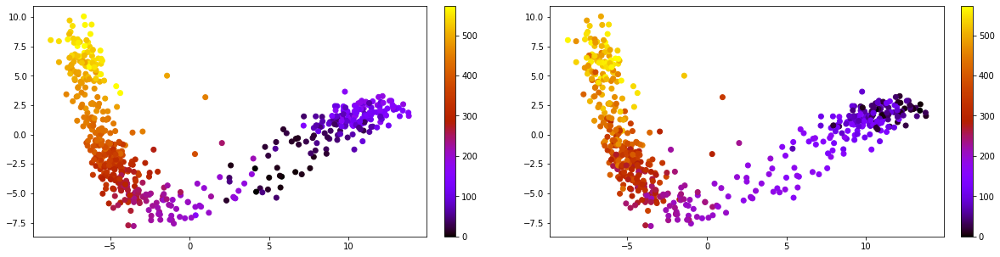

In [11]:
for idx, data in enumerate(DataLoader(dataReal)):
    pt = data.y_vdpt[0].squeeze()

    # pt = np.argsort(pt)
    X_pca = utils.pca_op(data.x.detach().numpy(), standardize=False)
    fig = plt.figure(figsize = (20, 5))
    ax1,ax2 = fig.subplots(1,2)
    
    pred_sorted = sorted(pt)
    pt = [pred_sorted.index(i) for i in pt]

    pseudo_visual = ax1.scatter(X_pca[:,0], X_pca[:,1], c = pt, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax1)

    pt, _, _ = model(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    pt = pt.detach().numpy().squeeze()

    pred_sorted = sorted(pt)
    pt = [pred_sorted.index(i) for i in pt]
    # pt = (pt - np.min(pt))/(np.max(pt)-np.min(pt))
    # print(len(pt))
    # pt = np.argsort(pt)
    
    pseudo_visual = ax2.scatter(X_pca[:,0], X_pca[:,1], c = pt, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax2)    

    